In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
import warnings 
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv('global_cancer_patients_2015_2024.csv')

In [4]:
df.head()

,Patient_ID,Age,Gender,Country_Region,Year,Genetic_Risk,Air_Pollution,Alcohol_Use,Smoking,Obesity_Level,Cancer_Type,Cancer_Stage,Treatment_Cost_USD,Survival_Years,Target_Severity_Score
0,PT0000000,71,Male,UK,2021,6.4,2.8,9.5,0.9,8.7,Lung,Stage III,62913.44,5.9,4.92
1,PT0000001,34,Male,China,2021,1.3,4.5,3.7,3.9,6.3,Leukemia,Stage 0,12573.41,4.7,4.65
2,PT0000002,80,Male,Pakistan,2023,7.4,7.9,2.4,4.7,0.1,Breast,Stage II,6984.33,7.1,5.84
3,PT0000003,40,Male,UK,2015,1.7,2.9,4.8,3.5,2.7,Colon,Stage I,67446.25,1.6,3.12
4,PT0000004,43,Female,Brazil,2017,5.1,2.8,2.3,6.7,0.5,Skin,Stage III,77977.12,2.9,3.62


In [5]:
df.shape

(50000, 15)

In [6]:
df.isnull().sum()

Patient_ID               0
Age                      0
Gender                   0
Country_Region           0
Year                     0
Genetic_Risk             0
Air_Pollution            0
Alcohol_Use              0
Smoking                  0
Obesity_Level            0
Cancer_Type              0
Cancer_Stage             0
Treatment_Cost_USD       0
Survival_Years           0
Target_Severity_Score    0
dtype: int64

In [7]:
df.duplicated().sum()

0

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Patient_ID             50000 non-null  object 
 1   Age                    50000 non-null  int64  
 2   Gender                 50000 non-null  object 
 3   Country_Region         50000 non-null  object 
 4   Year                   50000 non-null  int64  
 5   Genetic_Risk           50000 non-null  float64
 6   Air_Pollution          50000 non-null  float64
 7   Alcohol_Use            50000 non-null  float64
 8   Smoking                50000 non-null  float64
 9   Obesity_Level          50000 non-null  float64
 10  Cancer_Type            50000 non-null  object 
 11  Cancer_Stage           50000 non-null  object 
 12  Treatment_Cost_USD     50000 non-null  float64
 13  Survival_Years         50000 non-null  float64
 14  Target_Severity_Score  50000 non-null  float64
dtypes:

In [9]:
df.describe()

,Age,Year,Genetic_Risk,Air_Pollution,Alcohol_Use,Smoking,Obesity_Level,Treatment_Cost_USD,Survival_Years,Target_Severity_Score
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,54.421540,2019.480520,5.001698,5.010126,5.010880,4.989826,4.991176,52467.298239,5.006462,4.951207
std,20.224451,2.871485,2.885773,2.888399,2.888769,2.881579,2.894504,27363.229379,2.883335,1.199677
min,20.000000,2015.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5000.050000,0.000000,0.900000
25%,37.000000,2017.000000,2.500000,2.500000,2.500000,2.500000,2.500000,28686.225000,2.500000,4.120000
50%,54.000000,2019.000000,5.000000,5.000000,5.000000,5.000000,5.000000,52474.310000,5.000000,4.950000
75%,72.000000,2022.000000,7.500000,7.500000,7.500000,7.500000,7.500000,76232.720000,7.500000,5.780000
max,89.000000,2024.000000,10.000000,10.000000,10.000000,10.000000,10.000000,99999.840000,10.000000,9.160000


In [10]:
df.columns

Index(['Patient_ID', 'Age', 'Gender', 'Country_Region', 'Year', 'Genetic_Risk',
       'Air_Pollution', 'Alcohol_Use', 'Smoking', 'Obesity_Level',
       'Cancer_Type', 'Cancer_Stage', 'Treatment_Cost_USD', 'Survival_Years',
       'Target_Severity_Score'],
      dtype='object')

In [11]:
df.drop(columns=['Patient_ID'],inplace=True)

## Cancer Type Distribution

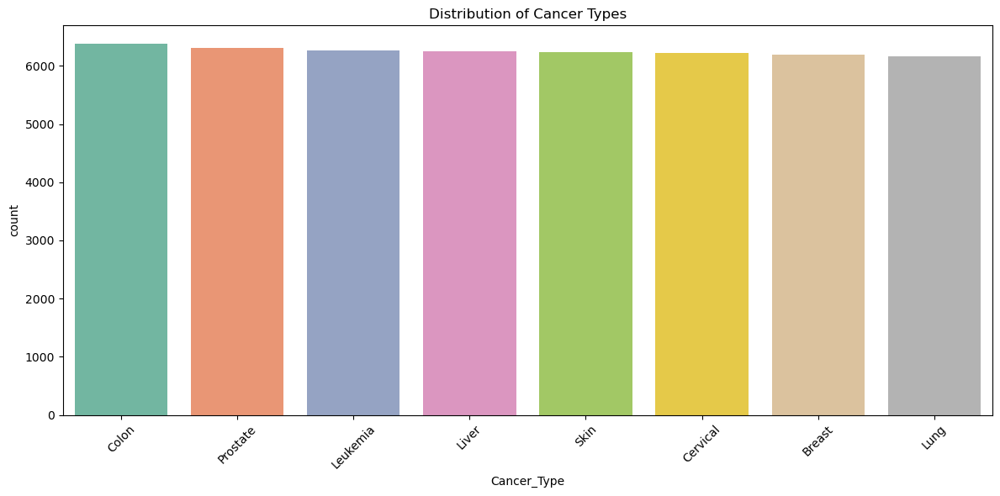

In [12]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='Cancer_Type', order=df['Cancer_Type'].value_counts().index, palette='Set2')
plt.title('Distribution of Cancer Types')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Cancer Stage by Age and Gender

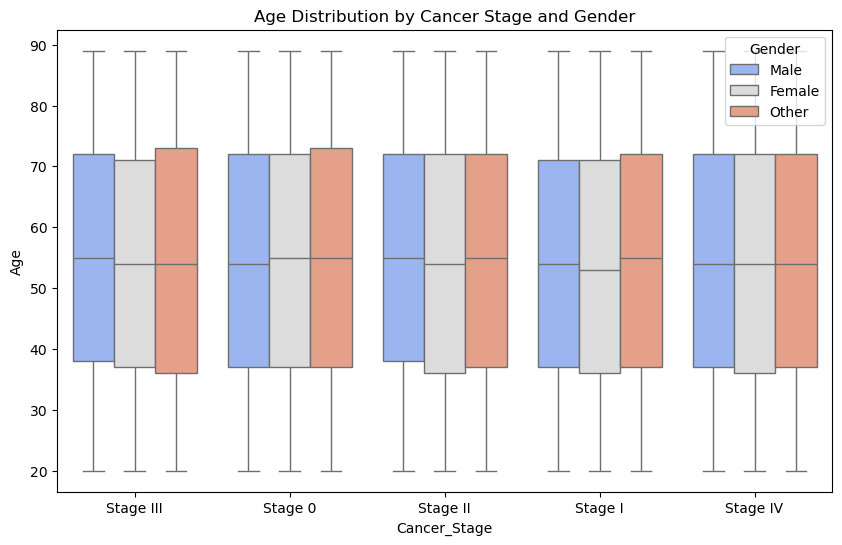

In [13]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='Cancer_Stage', y='Age', hue='Gender', palette='coolwarm')
plt.title('Age Distribution by Cancer Stage and Gender')
plt.show()

## Heatmap of Lifestyle Risk Factors vs Severity

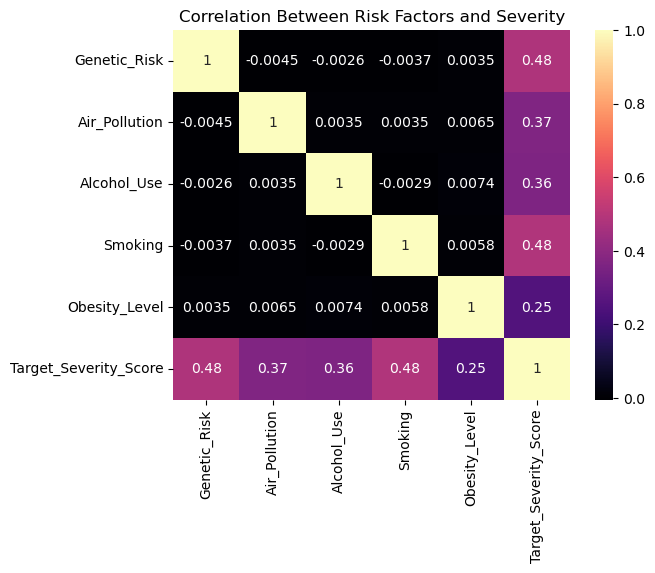

In [14]:
corr_cols = ['Genetic_Risk', 'Air_Pollution', 'Alcohol_Use', 'Smoking', 'Obesity_Level', 'Target_Severity_Score']
sns.heatmap(df[corr_cols].corr(), annot=True, cmap='magma')
plt.title('Correlation Between Risk Factors and Severity')
plt.show()

## Average Treatment Cost by Country

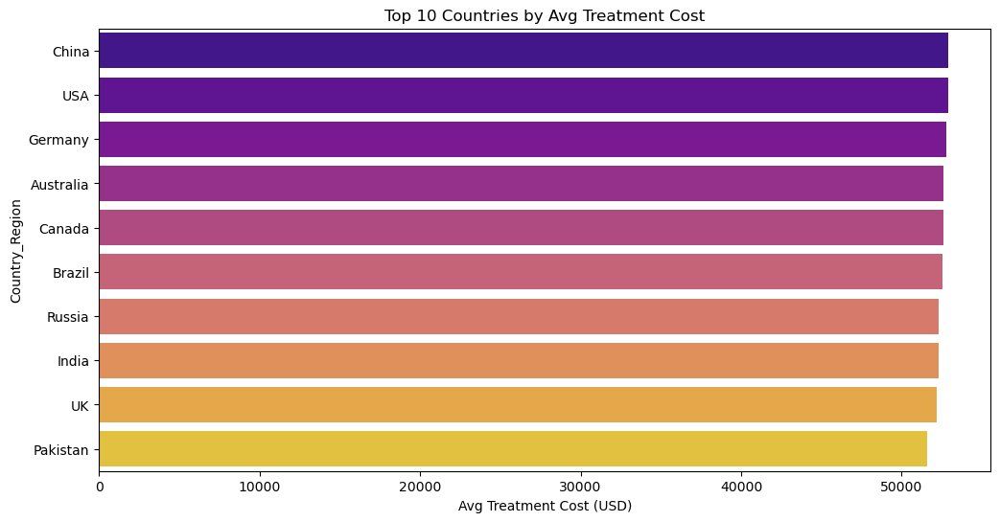

In [16]:
avg_cost = df.groupby('Country_Region')['Treatment_Cost_USD'].mean().sort_values(ascending=False).head(10)
plt.figure(figsize=(12, 6))
sns.barplot(x=avg_cost.values, y=avg_cost.index, palette='plasma')
plt.title('Top 10 Countries by Avg Treatment Cost')
plt.xlabel('Avg Treatment Cost (USD)')
plt.show()

## Pairplot of Risk Factors Colored by Cancer Stage

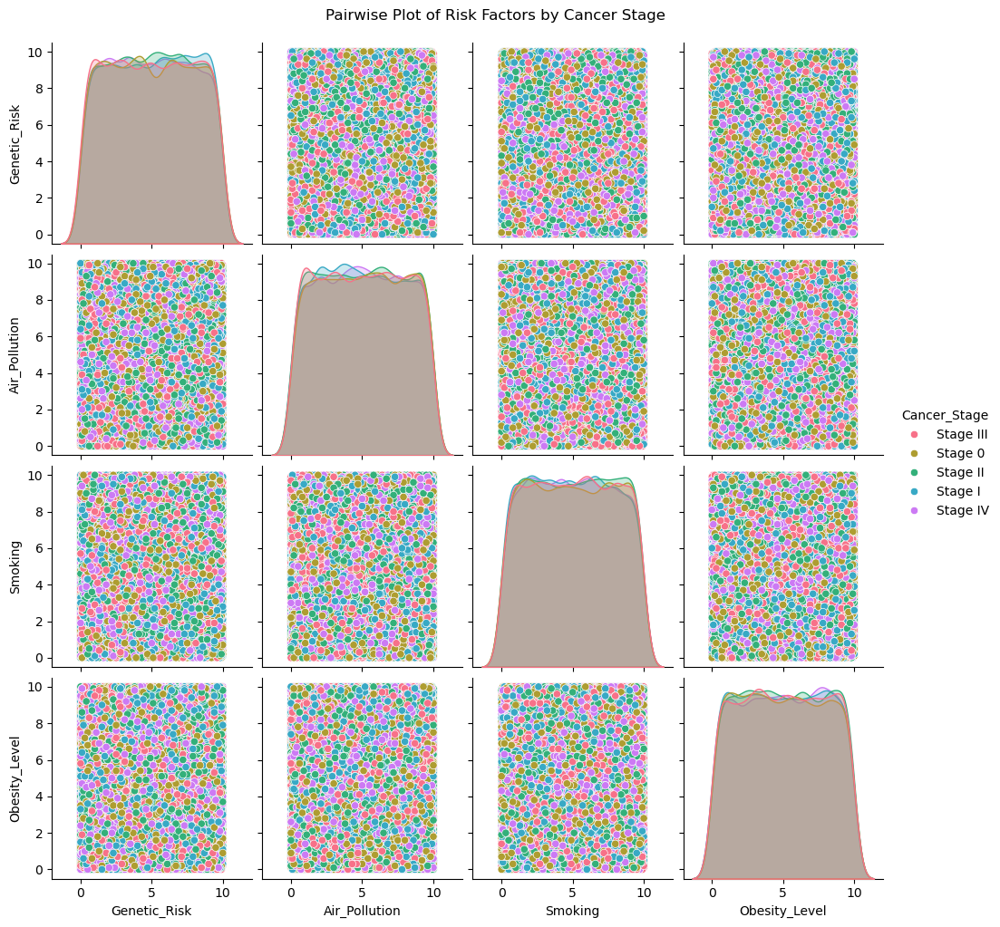

In [17]:
sns.pairplot(df, hue='Cancer_Stage', vars=['Genetic_Risk', 'Air_Pollution', 'Smoking', 'Obesity_Level'], palette='husl')
plt.suptitle("Pairwise Plot of Risk Factors by Cancer Stage", y=1.02)
plt.show()

## Time Series of Severity Score Over Years

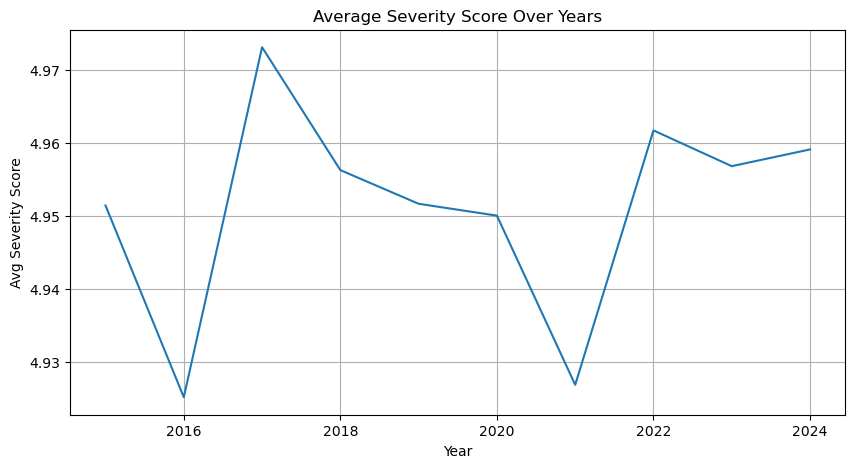

In [18]:
plt.figure(figsize=(10, 5))
sns.lineplot(data=df.groupby('Year')['Target_Severity_Score'].mean().reset_index(), x='Year', y='Target_Severity_Score')
plt.title('Average Severity Score Over Years')
plt.ylabel('Avg Severity Score')
plt.xlabel('Year')
plt.grid(True)
plt.show()

## Violin Plot of Treatment Cost by Cancer Type

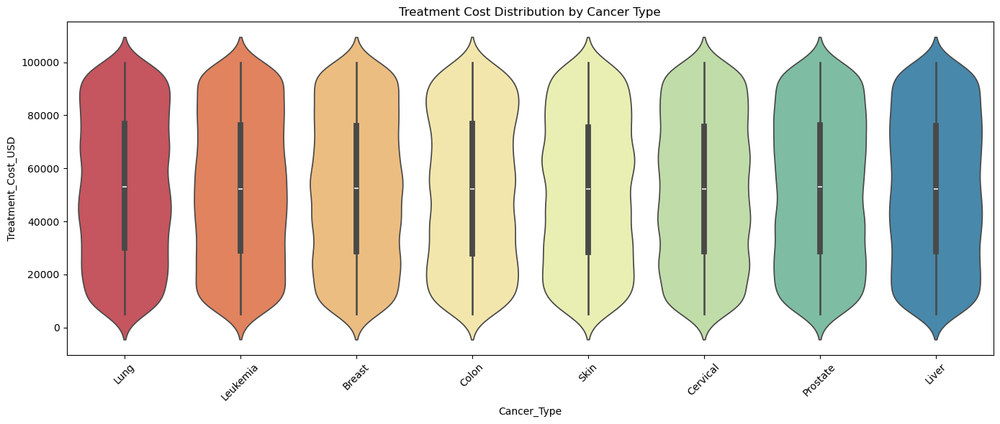

In [20]:
plt.figure(figsize=(14, 6))
sns.violinplot(data=df, x='Cancer_Type', y='Treatment_Cost_USD', inner='box', palette='Spectral')
plt.title('Treatment Cost Distribution by Cancer Type')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Geographic Heatmap of Cancer Severity (Country-wise)

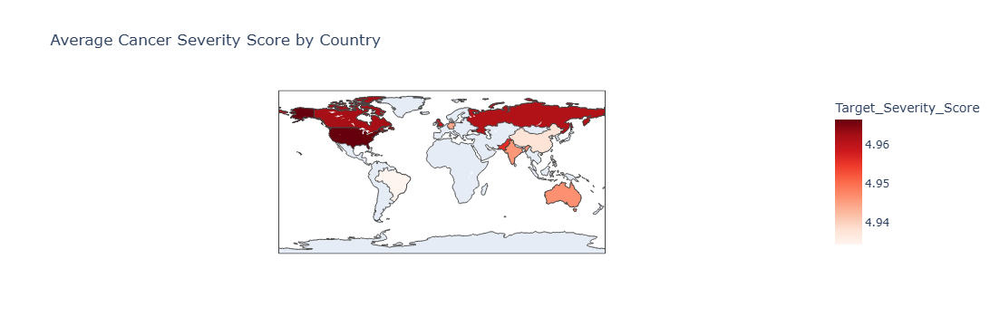

In [21]:
import plotly.express as px
country_severity = df.groupby('Country_Region')['Target_Severity_Score'].mean().reset_index()

fig = px.choropleth(country_severity, 
                    locations='Country_Region', locationmode='country names',
                    color='Target_Severity_Score', 
                    color_continuous_scale='Reds',
                    title='Average Cancer Severity Score by Country')
fig.show()

## Sunburst Chart – Hierarchical breakdown (Gender → Cancer Type → Stage)

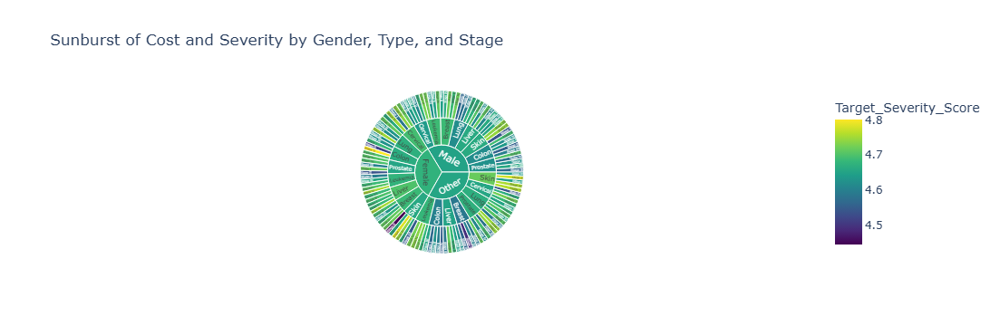

In [22]:
fig = px.sunburst(df, path=['Gender', 'Cancer_Type', 'Cancer_Stage'], 
                  values='Treatment_Cost_USD', 
                  color='Target_Severity_Score',
                  color_continuous_scale='Viridis',
                  title='Sunburst of Cost and Severity by Gender, Type, and Stage')
fig.show()

## Faceted Grid Plot — Survival Years vs Age across Cancer Type

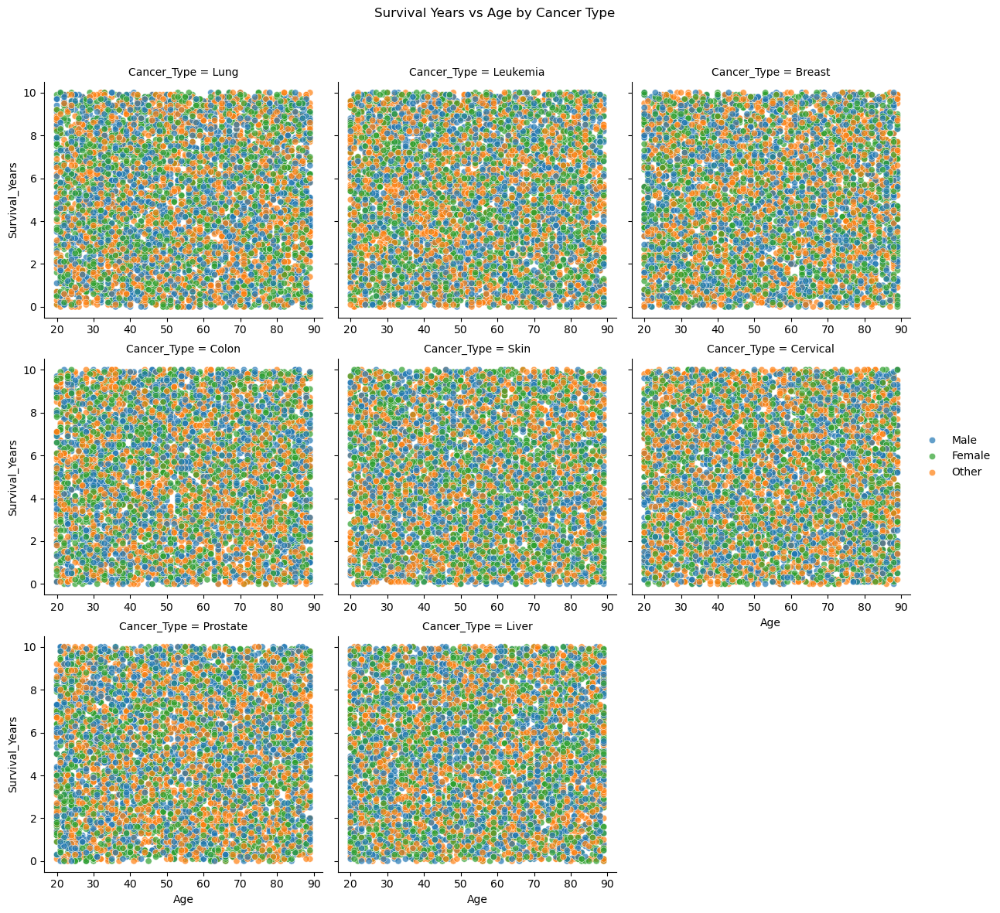

In [23]:
g = sns.FacetGrid(df, col="Cancer_Type", col_wrap=3, height=4, sharex=False)
g.map_dataframe(sns.scatterplot, x='Age', y='Survival_Years', hue='Gender', alpha=0.7)
g.add_legend()
g.fig.subplots_adjust(top=0.9)
g.fig.suptitle('Survival Years vs Age by Cancer Type')
plt.show()

## Correlation Heatmap of All Numerical Variables

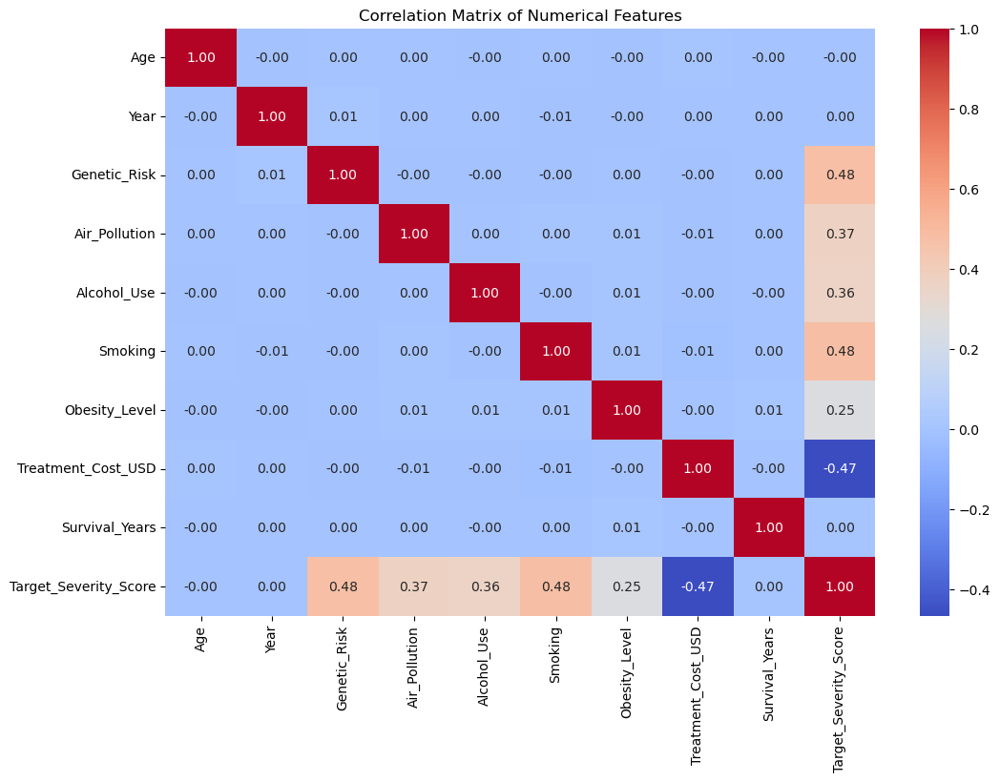

In [24]:
plt.figure(figsize=(12, 8))
sns.heatmap(df.select_dtypes(include='number').corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Features')
plt.show()

## 3D Scatter Plot (Treatment Cost vs Risk vs Severity)

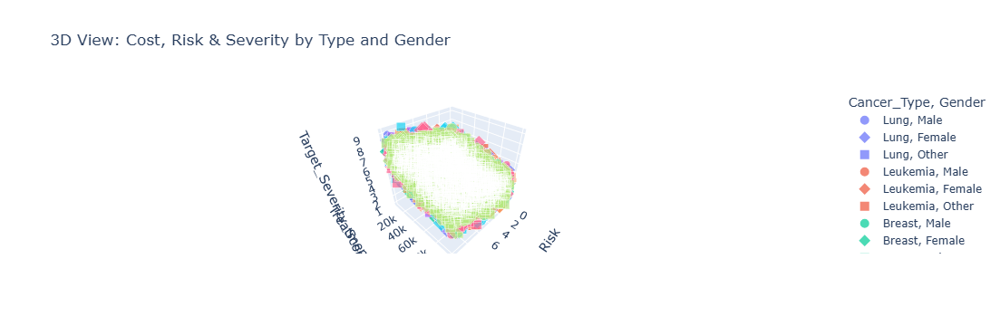

In [25]:
fig = px.scatter_3d(df, x='Genetic_Risk', y='Treatment_Cost_USD', z='Target_Severity_Score',
                    color='Cancer_Type', size='Survival_Years', symbol='Gender',
                    title='3D View: Cost, Risk & Severity by Type and Gender')
fig.show()

## Survival Trends Over Time

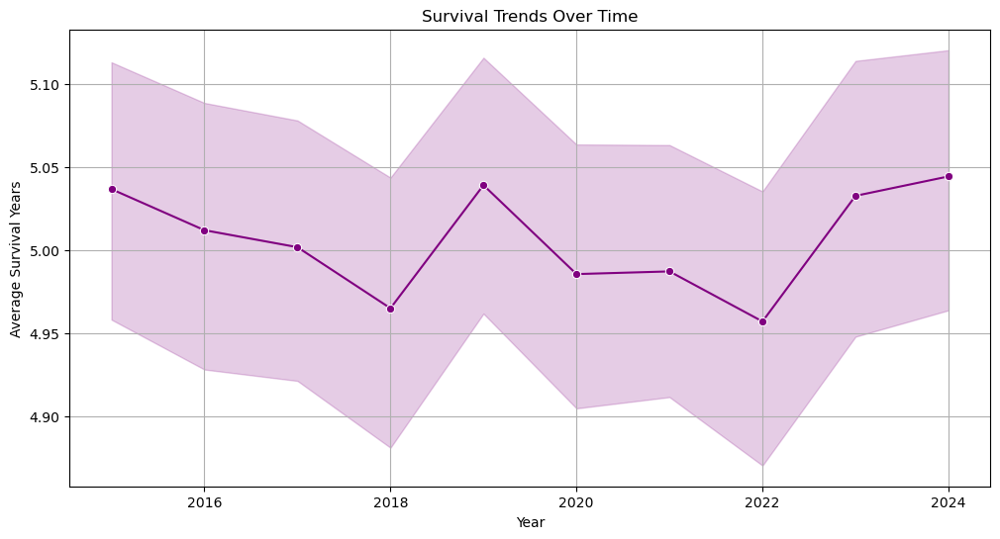

In [26]:
plt.figure(figsize=(12, 6))
sns.lineplot(
    x='Year', 
    y='Survival_Years', 
    data=df, 
    ci=95,  # 95% confidence interval
    marker='o',
    color='purple'
)
plt.title("Survival Trends Over Time")
plt.xlabel("Year")
plt.ylabel("Average Survival Years")
plt.grid(True)
plt.show()